<h1>1.2. Construcción de una imagen artificial (pero realista)

Antes de pasar a mirar una imagen real, dediquemos unos minutos a sentirnos cómodos con el aspecto de cada una de las diferentes fuentes de conteo en una imagen artificial. La ventaja es que podemos controlar cuánto de cada fuente de conteo entra en la imagen. Mirar ejemplos extremos puede ayudar a construir una comprensión de lo que está pasando en sus imágenes.

<h1>1.2.1. Importaciones 

Casi todos los cuadernos de este tutorial comenzarán con la importación de los paquetes de Python necesarios para ese cuaderno. Las líneas a continuación configuran matplotlib , un paquete de trazado ampliamente utilizado.

In [1]:
import os

%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from photutils.aperture import EllipticalAperture

In [2]:
# Use custom style for larger fonts and figures
plt.style.use('guide.mplstyle')

In [3]:
# Set up the random number generator, allowing a seed to be set from the environment
seed = os.getenv('GUIDE_RANDOM_SEED', None)

if seed is not None:
    seed = int(seed)
    
# This is the generator to use for any image component which changes in each image, e.g. read noise
# or Poisson error
noise_rng = np.random.default_rng(seed)

El archivo de Python al que se hace referencia a continuación, comfort_functions.py , contiene algunas funciones para mostrar imágenes de manera conveniente en un cuaderno. Tenga en cuenta que al hacer clic en el enlace anterior puede leer (o editar) el archivo en el navegador. También puede leerlo/editarlo en su editor preferido, pero es útil saber que es posible editar archivos de Python en el entorno del cuaderno Jupyter.

In [4]:
from convenience_functions import show_image

<h1>1.2.2. Inicio: una imagen en blanco


Comenzaremos con la imagen más simple posible: una matriz de ceros. Las dimensiones de la imagen a continuación se eligen para que coincidan con algunas imágenes reales con las que trabajaremos más adelante.

In [5]:
synthetic_image = np.zeros([1000, 1000])

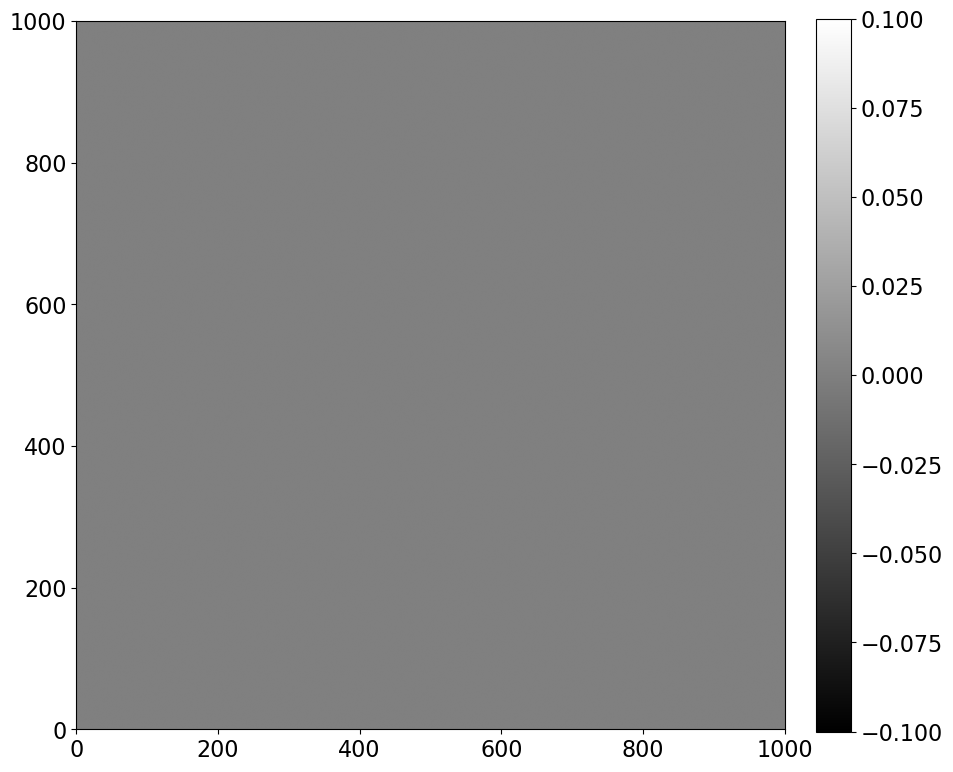

In [6]:
show_image(synthetic_image, cmap='gray')

<h1>1.2.3. Agregar algo de ruido de lectura 

Con cada una de las cosas que agreguemos, escribiremos una pequeña función para agregar para que sea más fácil experimentar con diferentes valores. El ruido de lectura tiene una distribución gaussiana; la desviación estándar del gaussiano (en conteos) es el ruido de lectura (en electrones) dividido por la ganancia (en electrones por conteo). El ruido de lectura casi siempre se expresa en electrones.

Tenga en cuenta que cada vez que ejecute esta función obtendrá un conjunto diferente de píxeles para que se comporte como un ruido real.

In [7]:
def read_noise(image, amount, gain=1):
    """
    Generate simulated read noise.
    
    Parameters
    ----------
    
    image: numpy array
        Image whose shape the noise array should match.
    amount : float
        Amount of read noise, in electrons.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
    """
    shape = image.shape
    
    noise = noise_rng.normal(scale=amount/gain, size=shape)
    
    return noise

<Figure size 1000x1000 with 0 Axes>

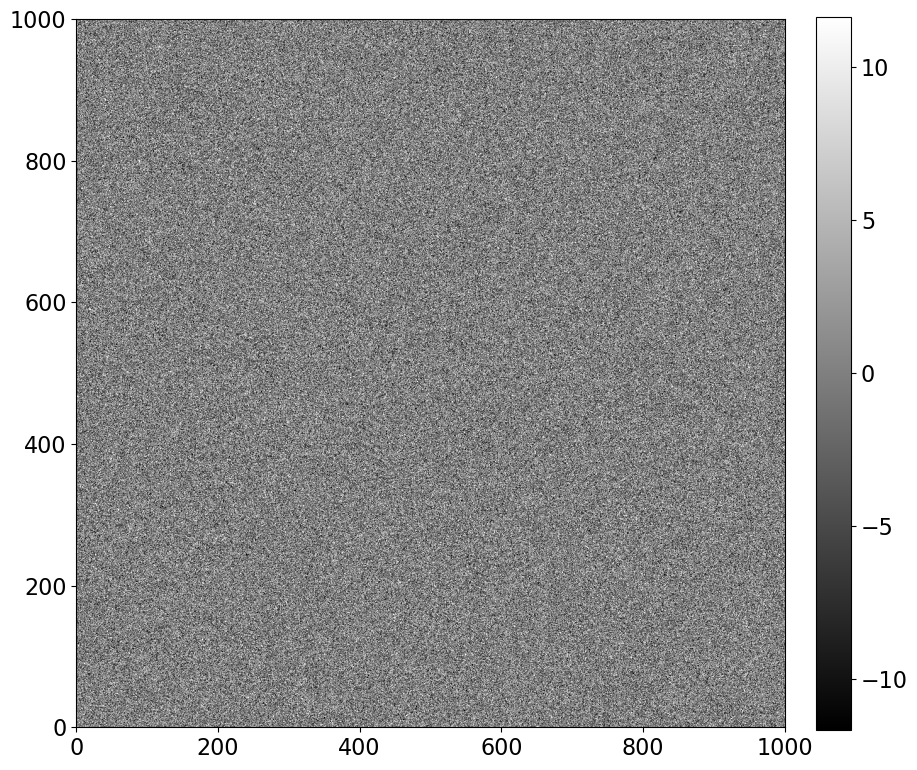

In [8]:
plt.figure()
noise_im = synthetic_image + read_noise(synthetic_image, 5)
show_image(noise_im, cmap='gray')

<h1>1.2.4. Bias

El bias es un voltaje de compensación (que se traduce en una cantidad de conteos distinta de cero) que se agrega a cada píxel de la imagen para garantizar que cuando los voltajes se conviertan en conteos, nunca haya un conteo negativo. Tenga en cuenta que en la imagen de ruido anterior, algunos recuentos son positivos y otros negativos, como cabría esperar de una distribución gaussiana centrada en cero. Sin embargo, los valores de píxel normalmente se leen de la electrónica como números positivos . Agregar un voltaje constante, que corresponde a un número positivo constante, asegura que incluso una imagen que consiste completamente en ruido no tenga valores negativos.

El valor de bias es aproximadamente el mismo en todo el chip CCD, aunque no es raro tener columnas y píxeles "malos" en los que el nivel de bias se compensa constantemente con el resto del chip.

Para modelar una imagen de bias, creamos una matriz uniforme y, opcionalmente, agregamos algunas columnas "malas". Las columnas malas se exageran aquí para garantizar que sean visibles.

Las columnas defectuosas en un CCD suelen ser estables durante mucho tiempo. A continuación se usa un generador de números aleatorios para elegir qué columnas de nuestro CCD son malas, pero usaremos una semilla para asegurarnos de que cada vez que generamos el bias obtengamos las mismas columnas malas (y los valores de píxel dentro de las columnas malas).

Esta estabilidad es la que permite corregir el efecto en imágenes reales.

Finalmente, tenga en cuenta que el bias no depende del tiempo de exposición. Esto se debe a que una exposición de bias es una exposición de cero segundos en la que la cámara simplemente lee el chip.

In [9]:
def bias(image, value, realistic=False):
    """
    Generate simulated bias image.
    
    Parameters
    ----------
    
    image: numpy array
        Image whose shape the bias array should match.
    value: float
        Bias level to add.
    realistic : bool, optional
        If ``True``, add some columns with somewhat higher bias value (a not uncommon thing)
    """
    # This is the whole thing: the bias is really suppose to be a constant offset!
    bias_im = np.zeros_like(image) + value
    
    # If we want a more realistic bias we need to do a little more work. 
    if realistic:
        shape = image.shape
        number_of_colums = 5
        
        # We want a random-looking variation in the bias, but unlike the readnoise the bias should 
        # *not* change from image to image, so we make sure to always generate the same "random" numbers.
        rng = np.random.RandomState(seed=8392)  # 20180520
        columns = rng.randint(0, shape[1], size=number_of_colums)
        # This adds a little random-looking noise into the data.
        col_pattern = rng.randint(0, int(0.1 * value), size=shape[0])
        
        # Make the chosen columns a little brighter than the rest...
        for c in columns:
            bias_im[:, c] = value + col_pattern
            
    return bias_im
        

Text(0.5, 1.0, 'Bias alone, bad columns included')

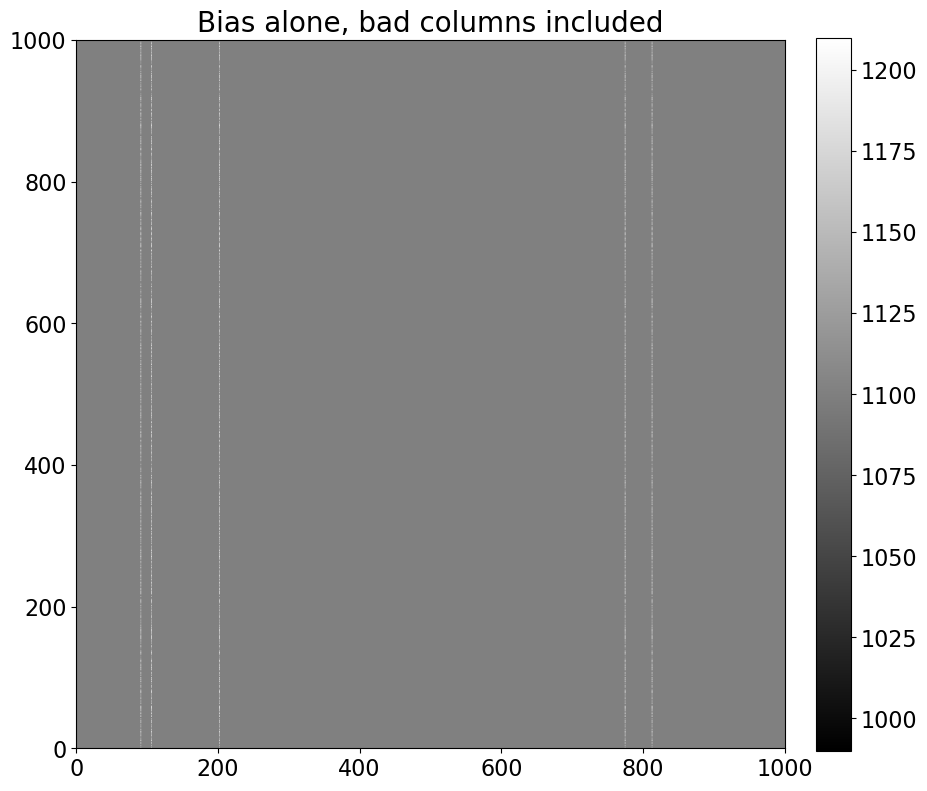

In [10]:
bias_only = bias(synthetic_image, 1100, realistic=True)
show_image(bias_only, cmap='gray', figsize=(10, 10))
plt.title('Bias alone, bad columns included', fontsize='20')

Text(0.5, 1.0, 'Realistic bias frame (includes read noise)')

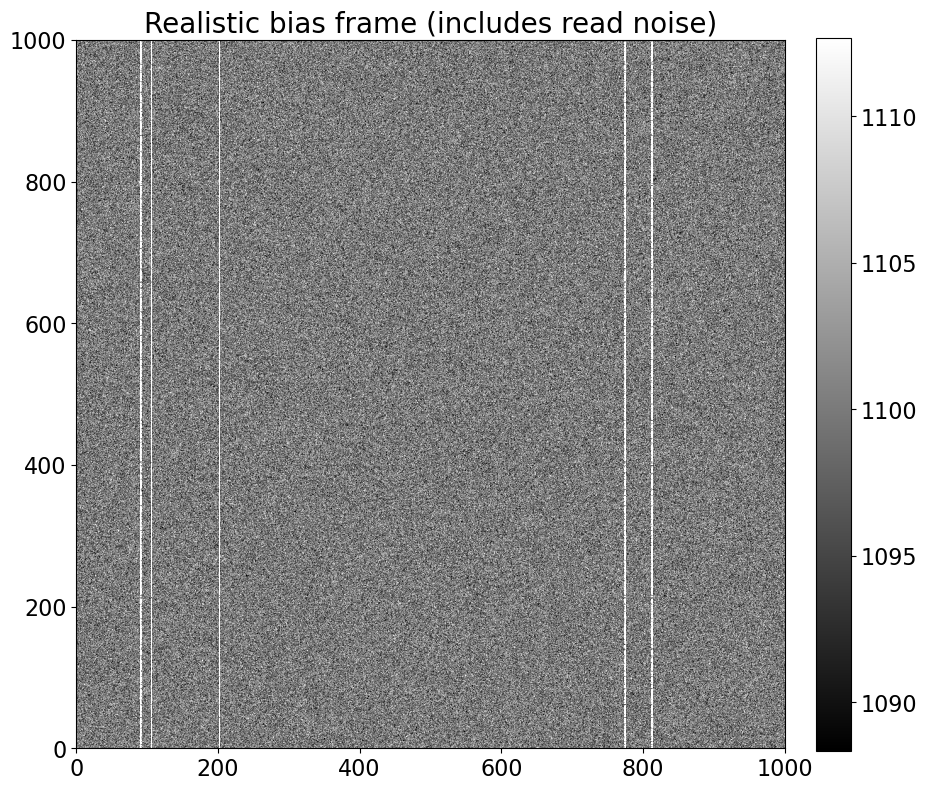

In [11]:
bias_noise_im = noise_im + bias_only
show_image(bias_noise_im, cmap='gray', figsize=(10, 10))
plt.title('Realistic bias frame (includes read noise)', fontsize='20')

<h1>Dark current

LaDark current depende de la temperatura del sensor. La cantidad de conteos oscuros en una imagen también depende del tiempo de exposición. La Dark current suele ser muy pequeña (0,1 electrones/píxel/segundo o menos). Los conteos oscuros en esta función se calculan multiplicando la Dark current de entrada por el tiempo de exposición de entrada después de convertir la unidad de Dark current de electrones a conteos usando la ganancia.

Una pequeña fracción de los píxeles están "calientes": su Dark current es mucho mayor que el resto de los píxeles. Los píxeles calientes se modelan aquí eligiendo un subconjunto de píxeles para que tenga una Dark current 10 000 veces mayor que la Dark current de entrada. Esto exagera el efecto para que esos píxeles sean más visibles.

La ubicación y la corriente de los píxeles calientes suelen ser estables durante largos períodos de tiempo, lo que hace que sea sencillo eliminar su efecto de las imágenes científicas restándolos.

Un cuadro oscuro (o imagen oscura) es una imagen tomada con el obturador de la cámara cerrado.

La siguiente función simula únicamente la Dark current, es decir, no simula el ruido de lectura que forma parte de cualquier cuadro oscuro real de un CCD.

Tenga en cuenta que la imagen oscura de simulación parece ruidosa aunque no incluye ruido de lectura. Esto se debe a que el número de electrones generados obedece a una distribución de Poisson.

In [12]:
def dark_current(image, current, exposure_time, gain=1.0, hot_pixels=False):
    """
    Simulate dark current in a CCD, optionally including hot pixels.
    
    Parameters
    ----------
    
    image : numpy array
        Image whose shape the cosmic array should match.
    current : float
        Dark current, in electrons/pixel/second, which is the way manufacturers typically 
        report it.
    exposure_time : float
        Length of the simulated exposure, in seconds.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
    strength : float, optional
        Pixel count in the cosmic rays.    
    """
    
    # dark current for every pixel; we'll modify the current for some pixels if 
    # the user wants hot pixels.
    base_current = current * exposure_time / gain
    
    # This random number generation should change on each call.
    dark_im = noise_rng.poisson(base_current, size=image.shape)
        
    if hot_pixels:
        # We'll set 0.01% of the pixels to be hot; that is probably too high but should 
        # ensure they are visible.
        y_max, x_max = dark_im.shape
        
        n_hot = int(0.0001 * x_max * y_max)
        
        # Like with the bias image, we want the hot pixels to always be in the same places
        # (at least for the same image size) but also want them to appear to be randomly
        # distributed. So we set a random number seed to ensure we always get the same thing.
        rng = np.random.RandomState(16201649)
        hot_x = rng.randint(0, x_max, size=n_hot)
        hot_y = rng.randint(0, y_max, size=n_hot)
        
        hot_current = 10000 * current
        
        dark_im[[hot_y, hot_x]] = hot_current * exposure_time / gain
    return dark_im

C:\Users\Saike\AppData\Local\Temp/ipykernel_6228/116257232.py:44: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  dark_im[[hot_y, hot_x]] = hot_current * exposure_time / gain


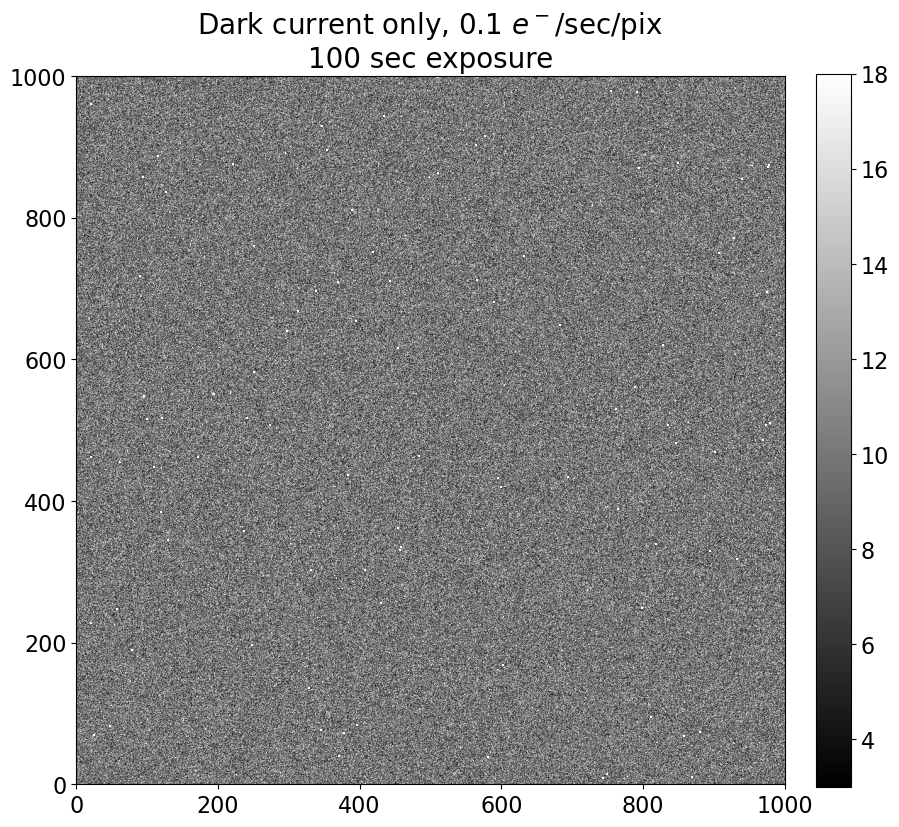

In [13]:
dark_exposure = 100
dark_cur = 0.1
dark_only = dark_current(synthetic_image, dark_cur, dark_exposure, hot_pixels=True)
show_image(dark_only, cmap='gray')
title_string = 'Dark current only, {dark_cur} $e^-$/sec/pix\n{dark_exposure} sec exposure'.format(dark_cur=dark_cur, dark_exposure=dark_exposure)
plt.title(title_string, fontsize='20');

Tenga en cuenta que el valor central de la barra de colores de la imagen es 10, el producto de la dark current y el tiempo de exposición.

Text(0.5, 1.0, 'Realistic dark frame \n(with bias, read noise)')

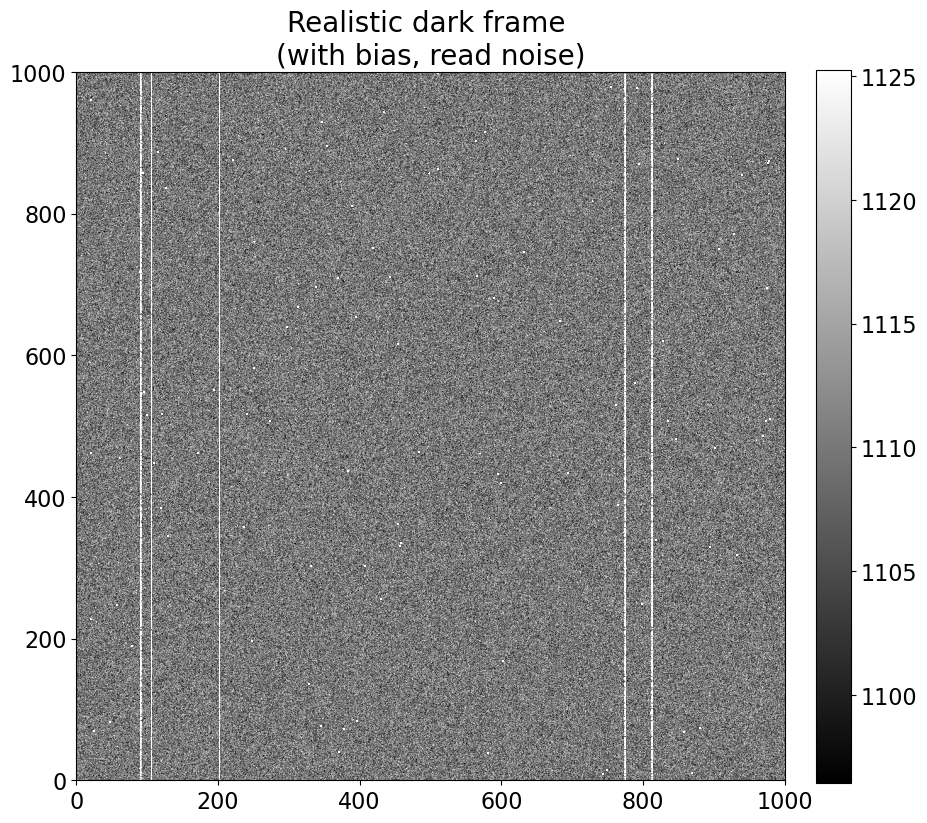

In [14]:
dark_bias_noise_im = bias_noise_im + dark_only
show_image(dark_bias_noise_im, cmap='gray')
plt.title('Realistic dark frame \n(with bias, read noise)', fontsize='20')

<h1>1.2.6. Sky background

La cantidad de Sky background depende de las condiciones atmosféricas (humedad, presencia de nubes ligeras, incendios contra el viento desde el observatorio), las fuentes de luz en el cielo (la Luna) y las fuentes de luz en el área circundante (ciudades). Puede ser uniforme en todo el marco o puede no serlo, según las condiciones.

La siguiente función genera un Sky background. Cada vez que lo ejecute obtendrá resultados ligeramente diferentes (incluso si mantiene igual la cantidad deseada de recuentos de cielo) porque los recuentos de una fuente de luz siguen una distribución de Poisson.

La cantidad de Sky background es directamente proporcional al tiempo de exposición. Sin embargo, en la función a continuación, ingresa el número deseado de conteos de cielo.

No es inusual tener un degradado en el cielo a lo largo de la imagen, pero ese efecto no se simula aquí.

In [15]:
def sky_background(image, sky_counts, gain=1):
    """
    Generate sky background, optionally including a gradient across the image (because
    some times Moons happen).
    
    Parameters
    ----------
    
    image : numpy array
        Image whose shape the cosmic array should match.
    sky_counts : float
        The target value for the number of counts (as opposed to electrons or 
        photons) from the sky.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
    """
    sky_im = noise_rng.poisson(sky_counts * gain, size=image.shape) / gain
    
    return sky_im

Text(0.5, 1.0, 'Sky background only, 20 counts input')

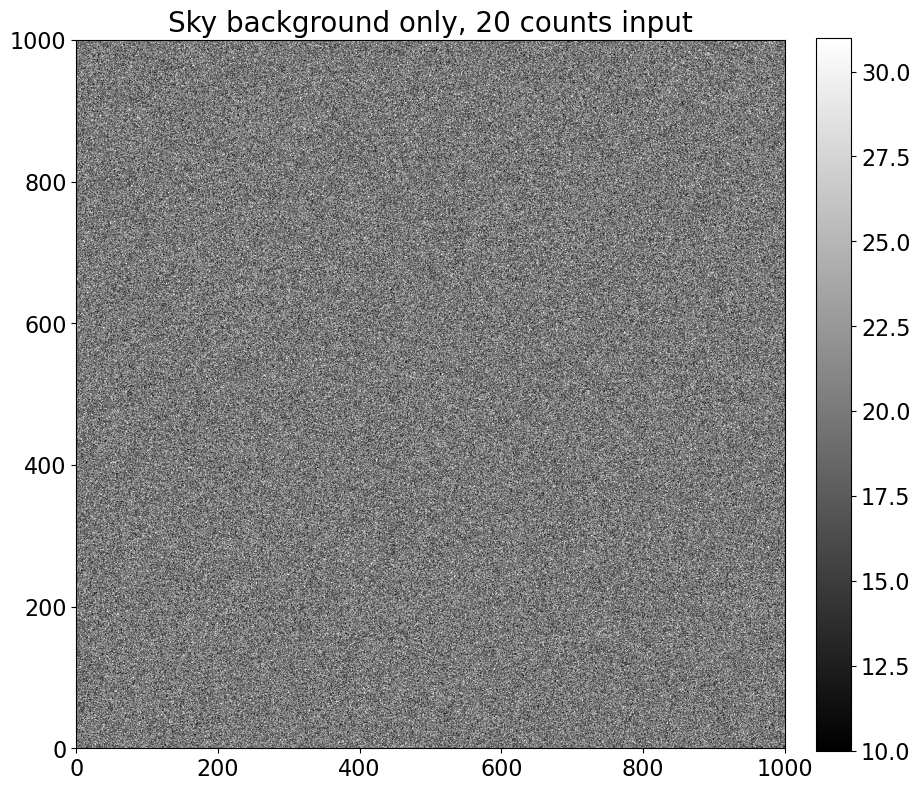

In [16]:
sky_level = 20
sky_only = sky_background(synthetic_image, sky_level)
show_image(sky_only, cmap='gray')
plt.title('Sky background only, {} counts input'.format(sky_level), fontsize=20)

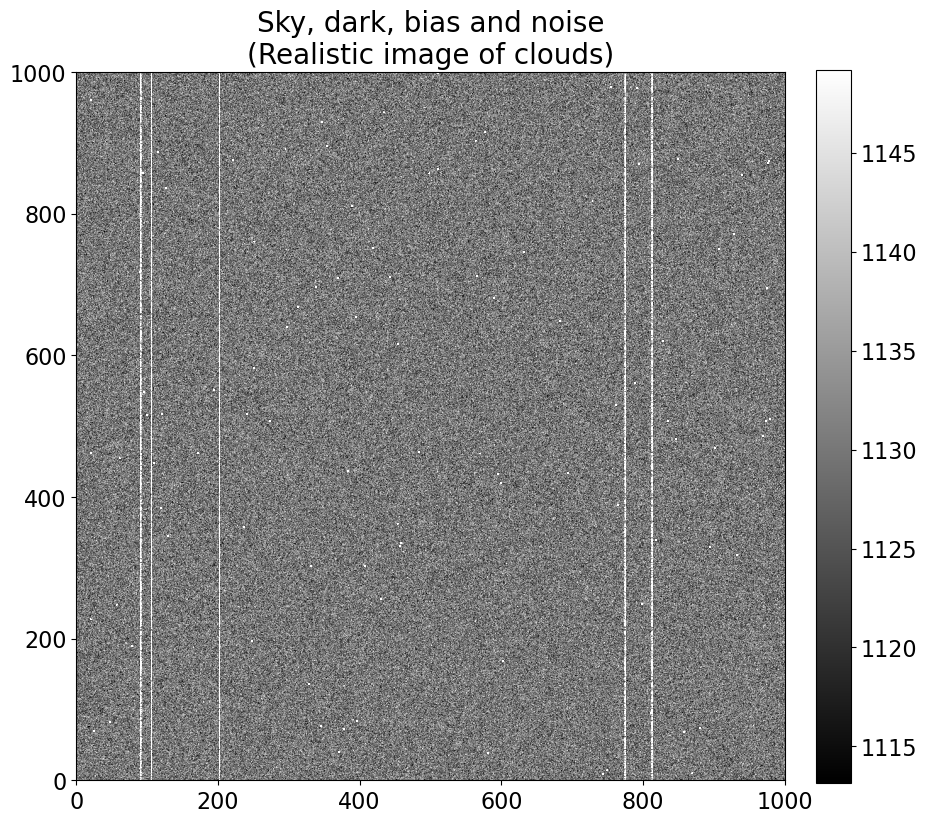

In [17]:
sky_dark_bias_noise_im = dark_bias_noise_im + sky_only
show_image(sky_dark_bias_noise_im, cmap='gray')
plt.title('Sky, dark, bias and noise\n(Realistic image of clouds)', fontsize=20);

<h2>1.2.6.1. Summary of the backgrounds in an astronomical image

Note that the central value of the pixels in the “realistic” cloud image above, 1130 or so, is the sum of the:

    bias level (1100 counts)

    dark current (10 counts, which is 0.1 e/sec/pix  100 sec, divided by the gain of 1 e/count)

    sky counts (20 counts)

The distribution of counts around that is determined by the read noise (5 electrons) and the expected width of a Poisson distribution for the sky counts, which is the square root of the number of those counts, . Add those in quadrature and you get about 6.7.

<h1>1.2.6.2. Demostración interactiva

La siguiente celda configura una demostración interactiva que le permite cambiar el valor del ruido de lectura y otros parámetros para ver el efecto que tiene cambiarlos en la imagen resultante.

In [18]:
from ipywidgets import interactive, interact

# @interact(bias_level=(1000,1200,10), dark=(0.01,1,0.01), sky_counts=(0, 300, 10),
#           gain=(0.5, 3.0, 0.1), read=(0, 50, 2.0),
#           exposure=(0, 300, 10))
def complete_image(bias_level=1100, read=10.0, gain=1, dark=0.1, 
                   exposure=30, hot_pixels=True, sky_counts=200):
    synthetic_image = np.zeros([500, 500])
    show_image(synthetic_image + 
               read_noise(synthetic_image, read) +
               bias(synthetic_image, bias_level, realistic=True) + 
               dark_current(synthetic_image, dark, exposure, hot_pixels=hot_pixels) +
               sky_background(synthetic_image, sky_counts),
               cmap='gray',
               figsize=None)
    
i = interactive(complete_image, bias_level=(1000,1200,10), dark=(0.0,1,0.1), sky_counts=(0, 300, 50),
          gain=(0.5, 3.0, 0.25), read=(0, 50, 5.0),
          exposure=(0, 300, 30))

for kid in i.children:
    try:
        kid.continuous_update = False
    except KeyError:
        pass
i

interactive(children=(IntSlider(value=1100, continuous_update=False, description='bias_level', max=1200, min=1…

<h1>1.2.7. Agrega algunas “estrellas”

Las "estrellas" que agregaremos a continuación son esencialmente solo fuentes gaussianas (redondas). La función que hace la mayor parte del trabajo es de photutils , a la que volveremos más adelante para hacer fotometría.

In [19]:
def stars(image, number, max_counts=10000, gain=1):
    """
    Add some stars to the image.
    """
    from photutils.datasets import make_random_gaussians_table, make_gaussian_sources_image
    # Most of the code below is a direct copy/paste from
    # https://photutils.readthedocs.io/en/stable/_modules/photutils/datasets/make.html#make_100gaussians_image
    
    flux_range = [max_counts/10, max_counts]
    
    y_max, x_max = image.shape
    xmean_range = [0.1 * x_max, 0.9 * x_max]
    ymean_range = [0.1 * y_max, 0.9 * y_max]
    xstddev_range = [4, 4]
    ystddev_range = [4, 4]
    params = dict([('amplitude', flux_range),
                  ('x_mean', xmean_range),
                  ('y_mean', ymean_range),
                  ('x_stddev', xstddev_range),
                  ('y_stddev', ystddev_range),
                  ('theta', [0, 2*np.pi])])

    sources = make_random_gaussians_table(number, params,
                                          seed=12345)
    
    star_im = make_gaussian_sources_image(image.shape, sources)
    
    return star_im

Text(0.5, 1.0, 'Stars only')

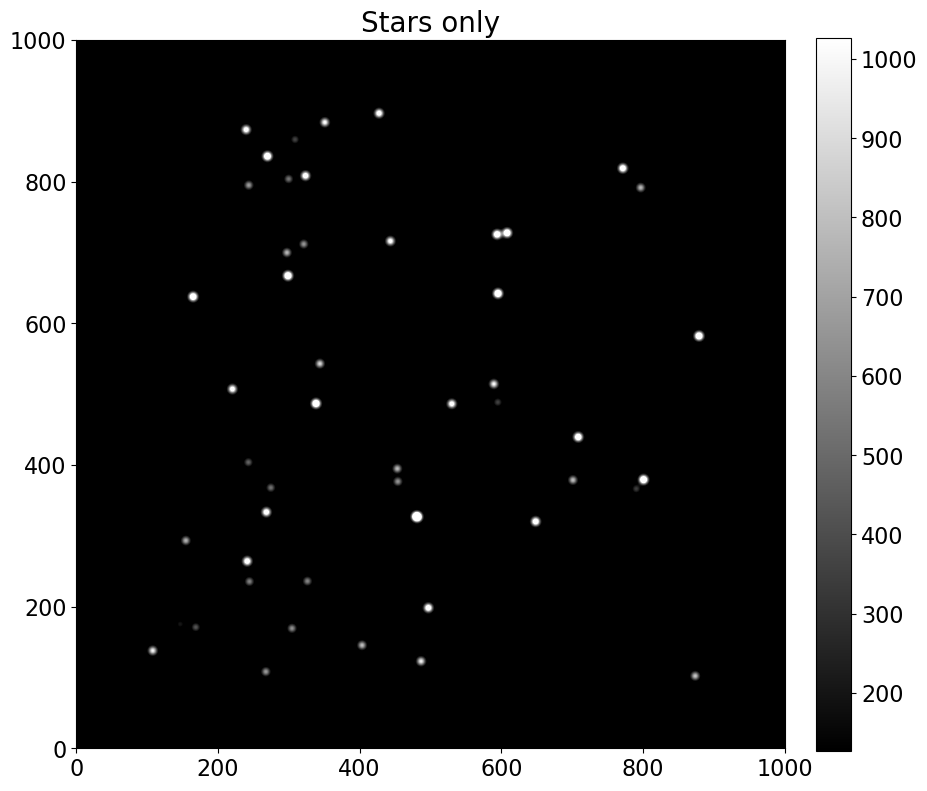

In [20]:
stars_only = stars(synthetic_image, 50, max_counts=2000)
show_image(stars_only, cmap='gray', percu=99.9)
plt.title('Stars only'.format(stars_only), fontsize=20)

In [21]:
stars_with_background = sky_dark_bias_noise_im + stars_only

Text(0.5, 1.0, 'Stars with noise, bias, dark, sky')

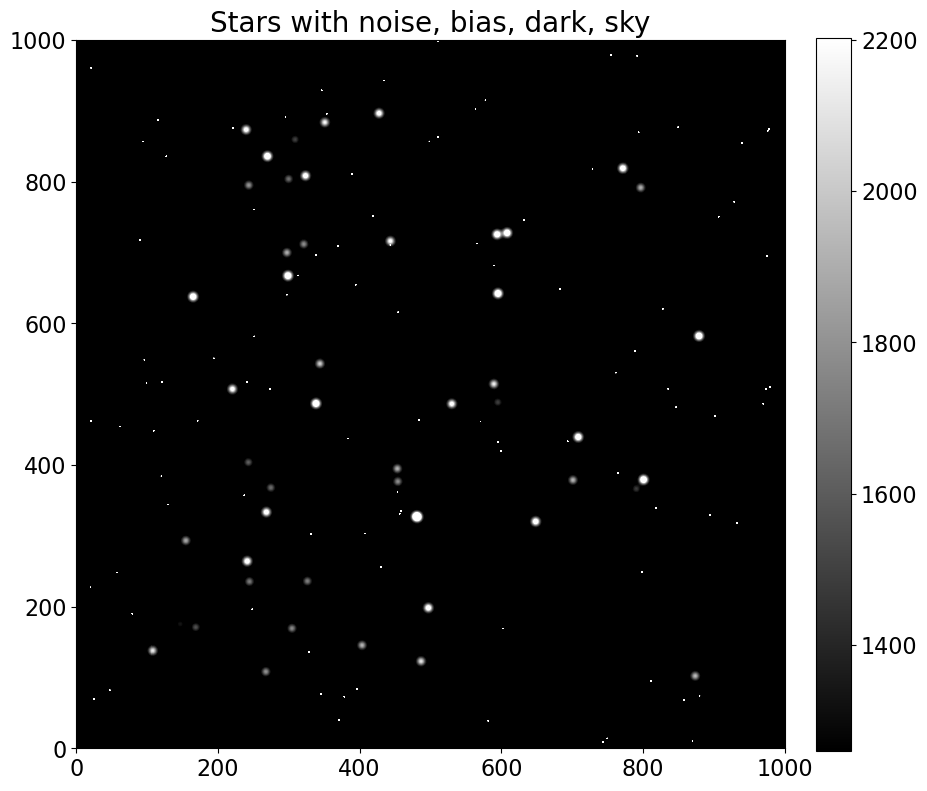

In [22]:
show_image(stars_with_background, cmap='gray', percu=99.9)
plt.title('Stars with noise, bias, dark, sky'.format(stars_with_background), fontsize=20)

<h1>1.2.7.1. Discussion

In the image above the single-pixel bright dots are hot pixels while the remaining dots that are larger than a pixel are simulated stars.

<h1>1.2.8. Summary

Todo lo que hemos incluido hasta ahora ha sido aditivo. Simbólicamente, la imagen simulada de arriba se construyó así:

                        image=bias+noise+dark current+sky +stars

Extraer la ciencia (es decir, las estrellas) es en principio una cuestión de sustracción:

                        stars=image-bias-noise-dark current-sky

Hay algunas complicaciones:

Hay efectos multiplicativos que se discutirán en el siguiente cuaderno.

La forma de medir cada una de las cosas que necesitamos restar (bias y corriente oscura) es tomando imágenes, cada una de las cuales incluye ruido de lectura. Eso se puede minimizar combinando varias imágenes de calibración.

No hay forma de restar el ruido de lectura porque es aleatorio.